In [21]:
# import tensorflow as tf

# print(tf.__version__)

In [2]:
# import os
# os.environ.get("tf_upgrade_v2")

In [1]:
# !tf_upgrade_v2 \
#   --infile /home/zcxia/TradeMaster/data_synthesis/TimeGAN/timegan.py \
#   --outfile /home/zcxia/TradeMaster/data_synthesis/TimeGAN/timegan_v2.py \
#   --reportfile report.txt

In [21]:
# import tensorflow as tf

# print(tf.__version__)

In [20]:
# import os
# os.environ.get("tf_upgrade_v2")

# TimeGAN Tutorial

## Time-series Generative Adversarial Networks

- Paper: Jinsung Yoon, Daniel Jarrett, Mihaela van der Schaar, "Time-series Generative Adversarial Networks," Neural Information Processing Systems (NeurIPS), 2019.

- Paper link: https://papers.nips.cc/paper/8789-time-series-generative-adversarial-networks

- Last updated Date: April 24th 2020

- Code author: Jinsung Yoon (jsyoon0823@gmail.com)

This notebook describes the user-guide of a time-series synthetic data generation application using timeGAN framework. We use Stock, Energy, and Sine dataset as examples.

### Prerequisite
Clone https://github.com/jsyoon0823/timeGAN.git to the current directory.

## Necessary packages and functions call

- timegan: Synthetic time-series data generation module
- data_loading: 2 real datasets and 1 synthetic datasets loading and preprocessing
- metrics: 
    - discriminative_metrics: classify real data from synthetic data
    - predictive_metrics: train on synthetic, test on real
    - visualization: PCA and tSNE analyses

In [83]:
## Necessary packages
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import numpy as np
import warnings
warnings.filterwarnings("ignore")

# 1. TimeGAN model
from timegan import timegan
# 2. Data loading
from data_loading import real_data_loading, sine_data_generation
# 3. Metrics
from metrics.discriminative_metrics import discriminative_score_metrics
from metrics.predictive_metrics import predictive_score_metrics
from metrics.visualization_metrics import visualization
import pandas as pd
from tqdm import tqdm

## Data Loading

Load original dataset and preprocess the loaded data.

- data_name: stock, energy, or sine
- seq_len: sequence length of the time-series data

In [84]:
data=pd.read_csv("/home/zcxia/TradeMaster/data/data/dj30/dj30_labeled_3_24.csv").reset_index()

In [85]:
display(data)

,index,Unnamed: 0,date,open,high,low,close,adjcp,tic,zopen,...,zd_10,zd_15,zd_20,zd_25,zd_30,pct_return,adjcp_filtered,pct_return_filtered,label,stock_type
0,0,0,2012-01-03,14.621429,14.732143,14.607143,14.686786,12.575916,AAPL,-0.004450,...,-0.011415,0.002751,-0.061124,-0.072128,-0.126481,0.000000,12.575621,-0.001100,2,0
1,1,1,2012-01-04,14.642857,14.810000,14.617143,14.765714,12.643501,AAPL,-0.008320,...,-0.011415,0.002751,-0.061124,-0.072128,-0.126481,0.005374,12.696937,0.000104,2,0
2,2,2,2012-01-05,14.819643,14.948214,14.738214,14.929643,12.783867,AAPL,-0.007368,...,-0.011415,0.002751,-0.061124,-0.072128,-0.126481,0.011102,12.800068,0.001207,2,0
3,3,3,2012-01-06,14.991786,15.098214,14.972143,15.085714,12.917509,AAPL,-0.006226,...,-0.011415,0.002751,-0.061124,-0.072128,-0.126481,0.010454,12.870550,0.002026,2,0
4,4,4,2012-01-09,15.196429,15.276786,15.048214,15.061786,12.897021,AAPL,0.008939,...,-0.011415,0.002751,-0.061124,-0.072128,-0.126481,-0.001586,12.903865,0.002478,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72988,72988,72988,2021-12-27,139.600006,140.869995,139.570007,140.759995,140.217682,WMT,-0.008241,...,0.005428,-0.001702,-0.005965,0.000262,0.004064,0.009105,140.434421,0.001502,1,0
72989,72989,72989,2021-12-28,140.600006,142.970001,140.600006,142.779999,142.229904,WMT,-0.015268,...,-0.009350,-0.013800,-0.019776,-0.013620,-0.011165,0.014351,141.491412,0.003784,1,0
72990,72990,72990,2021-12-29,142.660004,143.529999,142.320007,142.710007,142.160172,WMT,-0.000350,...,-0.010427,-0.011113,-0.018369,-0.013554,-0.011524,-0.000490,142.436433,0.006163,1,0
72991,72991,72991,2021-12-30,143.259995,143.699997,142.479996,143.169998,142.618393,WMT,0.000629,...,-0.015422,-0.011231,-0.019225,-0.017298,-0.014566,0.003223,143.289840,0.008511,1,0


# preprocess data by stock group and regime

Seperate data into groups by (stock_type,regime_type)

In [86]:
stock_group_num=len(data['stock_type'].unique())
regime_num=len(data['label'].unique())

In [87]:
data_by_regime={}

In [88]:
for i in range(stock_group_num):
    for j in range(regime_num):
        data_seg=data.loc[(data['stock_type']==i) & (data['label']==j),['index','open','high','low','close','adjcp','pct_return','adjcp_filtered','pct_return_filtered']]
#         data_dict[(i,j)]=data_seg
        data_seg.to_csv('data_seg_'+str(i)+'_'+str(j)+'.csv')

In [89]:
def get_intervals(data):
    index=data['index']
    last_value=index[0]-1
    last_index=0
    intervals=[]
    for i in range(data.shape[0]):
        if last_value!=index[i]-1:
            intervals.append([last_index,i])
            last_value=index[i]
            last_index=i
        last_value=index[i]
    return intervals

In [90]:
def interpolation(data):
    max_len=24
    l=len(data)
    to_fill=max_len-l
    if to_fill!=0:
        interval=max_len//to_fill
        for j in range(to_fill):
            idx=(interval+1)*j+interval
            data.insert(min(idx,len(data)-1),float('nan'))
    data=pd.Series(data).interpolate(method='polynomial', order=2)
    return data

In [91]:
def minmax_normlization(data):
    normalized_data=(data-data.min())/(data.max()-data.min())
    return normalized_data

In [92]:
def get_data_of_same_length(data,seq_len):
    data_processed=[]
    intervals=get_intervals(data)
    temp_data=[]
    data.drop(columns=['index'])
    for interval in intervals:
        data_seg=data.iloc[interval[0]:interval[1],:].to_numpy()
        for i in range(0, len(data_seg) - seq_len):
            _x = data[i:i + seq_len]
            temp_data.append(_x)
    return temp_data

In [93]:
test_data=pd.read_csv('data_seg_0_0.csv')

In [94]:
process_data=get_data_of_same_length(test_data,24)

In [95]:
display(len(process_data))

825

In [96]:
display(process_data)

[    Unnamed: 0  index       open       high        low      close      adjcp  \
 0           66     66  22.361786  22.851429  22.332144  22.722500  19.456690   
 1           67     67  22.854643  23.000000  22.357143  22.444286  19.218456   
 2           68     68  22.721430  22.745358  22.262142  22.364286  19.149956   
 3           69     69  22.321428  22.547501  22.160713  22.241785  19.045067   
 4           70     70  22.289642  22.310715  21.553928  21.615356  18.508671   
 5           71     71  21.787857  21.795713  20.651787  20.718929  17.741079   
 6           72     72  20.676430  21.785713  20.425358  21.775000  18.645365   
 7           73     73  21.918571  22.151787  21.525356  21.726429  18.603785   
 8           74     74  21.436428  21.597500  20.875713  20.980000  17.964636   
 9           75     75  21.120714  21.236429  20.372143  20.463572  17.522429   
 10          76     76  20.378929  20.595358  19.879286  20.417856  17.483282   
 11          77     77  20.0

In [97]:
for i in tqdm(range(len(process_data))):
    process_data[i]=minmax_normlization(process_data[i])

100%|███████████████████████████████████████████| 825/825 [00:01<00:00, 489.65it/s]


In [98]:
display(process_data)

[    Unnamed: 0     index      open      high       low     close     adjcp  \
 0     0.000000  0.000000  0.824047  0.945486  0.990141  1.000000  1.000000   
 1     0.043478  0.043478  1.000000  1.000000  1.000000  0.897433  0.897430   
 2     0.086957  0.086957  0.952442  0.906565  0.962535  0.867940  0.867938   
 3     0.130435  0.130435  0.809639  0.833967  0.922535  0.822778  0.822778   
 4     0.173913  0.173913  0.798291  0.747084  0.683239  0.591836  0.591836   
 5     0.217391  0.217391  0.619151  0.558118  0.327465  0.261356  0.261355   
 6     0.260870  0.260870  0.222364  0.554449  0.238169  0.650691  0.650689   
 7     0.304348  0.304348  0.665817  0.688770  0.671971  0.632785  0.632787   
 8     0.347826  0.347826  0.493688  0.485388  0.415774  0.357603  0.357606   
 9     0.391304  0.391304  0.380977  0.352903  0.217183  0.167215  0.167216   
 10    0.434783  0.434783  0.116155  0.117678  0.022817  0.150362  0.150362   
 11    0.478261  0.478261  0.014153  0.000000  0.000

In [99]:
style_data=real_data_loading('data_seg_0_0.csv', 24)

In [100]:
len(style_data)

2491

In [101]:
display(style_data)

[array([[0.02279527, 0.02279527, 0.21170873, 0.21037   , 0.20615999,
         0.20448331, 0.20551518, 0.41310362, 0.21132964, 0.54249892],
        [0.02278154, 0.02278154, 0.221367  , 0.21944704, 0.21872786,
         0.21970357, 0.22019783, 0.48827316, 0.21687515, 0.56597412],
        [0.02276782, 0.02276782, 0.22789922, 0.22550332, 0.22541289,
         0.22564391, 0.22592834, 0.52645283, 0.22094278, 0.59055887],
        [0.0227541 , 0.0227541 , 0.2219863 , 0.22541491, 0.22152073,
         0.22780133, 0.22696893, 0.60820939, 0.22290111, 0.6136502 ],
        [0.02274037, 0.02274037, 0.2160144 , 0.21754617, 0.21789595,
         0.21866919, 0.21818999, 0.56103207, 0.22388739, 0.63367329],
        [0.02272665, 0.02272665, 0.21952382, 0.2170599 , 0.21266676,
         0.2154478 , 0.21509319, 0.4662567 , 0.22569975, 0.65023745],
        [0.02271293, 0.02271293, 0.22726518, 0.23070494, 0.22345194,
         0.22415142, 0.22346018, 0.37452694, 0.22906416, 0.66385069],
        [0.0226992 , 0.0226

## Set network parameters

TimeGAN network parameters should be optimized for different datasets.

- module: gru, lstm, or lstmLN
- hidden_dim: hidden dimensions
- num_layer: number of layers
- iteration: number of training iterations
- batch_size: the number of samples in each batch

In [102]:
## Newtork parameters
parameters = dict()

parameters['module'] = 'gru' 
parameters['hidden_dim'] = 24
parameters['num_layer'] = 3
parameters['iterations'] = 10000
parameters['batch_size'] = 128

## Run TimeGAN for synthetic time-series data generation

TimeGAN uses the original data and network parameters to return the generated synthetic data.

In [103]:
# Run TimeGAN
generated_data = timegan(style_data, parameters,1)   
print('Finish Synthetic Data Generation')





Instructions for updating:
This class is equivalent as tf.keras.layers.GRUCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
Please use `keras.layers.RNN(cell)`, which is equivalent to this API
Instructions for updating:
Please use `layer.add_weight` method instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons


2022-12-23 14:55:46.484966: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2022-12-23 14:55:46.530145: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce RTX 3090 major: 8 minor: 6 memoryClockRate(GHz): 1.695
pciBusID: 0000:18:00.0
2022-12-23 14:55:46.530238: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libcudart.so.10.0'; dlerror: libcudart.so.10.0: cannot open shared object file: No such file or directory
2022-12-23 14:55:46.530283: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libcublas.so.10.0'; dlerror: libcublas.so.10.0: cannot open shared object file: No such file or directory
2022-12-23 14:55:46.530322: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libcufft.so.10.0'; dlerror: libcufft.so.10.0: cannot open shared 

Start Embedding Network Training
step: 0/10000, e_loss: 0.2581
step: 1000/10000, e_loss: 0.0386
step: 2000/10000, e_loss: 0.0326
step: 3000/10000, e_loss: 0.0204
step: 4000/10000, e_loss: 0.0163
step: 5000/10000, e_loss: 0.0147
step: 6000/10000, e_loss: 0.0107
step: 7000/10000, e_loss: 0.0117
step: 8000/10000, e_loss: 0.0094
step: 9000/10000, e_loss: 0.0097
Finish Embedding Network Training
Start Training with Supervised Loss Only
step: 0/10000, s_loss: 0.2494
step: 1000/10000, s_loss: 0.031
step: 2000/10000, s_loss: 0.0251
step: 3000/10000, s_loss: 0.0209
step: 4000/10000, s_loss: 0.0183
step: 5000/10000, s_loss: 0.0198
step: 6000/10000, s_loss: 0.0211
step: 7000/10000, s_loss: 0.0198
step: 8000/10000, s_loss: 0.0182
step: 9000/10000, s_loss: 0.0192
Finish Training with Supervised Loss Only

Start Joint Training
step: 0/10000, d_loss: 2.0363, g_loss_u: 0.6974, g_loss_s: 0.0315, g_loss_v: 0.3525, e_loss_t0: 0.0783
step: 1000/10000, d_loss: 1.3313, g_loss_u: 1.2101, g_loss_s: 0.0245, g_

## Evaluate the generated data

### 1. Discriminative score

To evaluate the classification accuracy between original and synthetic data using post-hoc RNN network. The output is |classification accuracy - 0.5|.

- metric_iteration: the number of iterations for metric computation.

In [104]:
metric_iteration = 5

discriminative_score = list()
for _ in range(metric_iteration):
    temp_disc = discriminative_score_metrics(style_data, generated_data)
    discriminative_score.append(temp_disc)

print('Discriminative score: ' + str(np.round(np.mean(discriminative_score), 4)))

Instructions for updating:
Please use tf.global_variables instead.


2022-12-23 16:01:42.645732: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:01:42.645760: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:02:04.934936: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:02:04.934967: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:02:27.700290: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:02:27.700321: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:02:50.596406: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:02:50.596443: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:03:13.254605: I tensorflow

Discriminative score: 0.2705


## Evaluate the generated data

### 2. Predictive score

To evaluate the prediction performance on train on synthetic, test on real setting. More specifically, we use Post-hoc RNN architecture to predict one-step ahead and report the performance in terms of MAE.

In [105]:
predictive_score = list()
for tt in range(metric_iteration):
  temp_pred = predictive_score_metrics(style_data, generated_data)
  predictive_score.append(temp_pred)   
    
print('Predictive score: ' + str(np.round(np.mean(predictive_score), 4)))

2022-12-23 16:03:36.388390: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:03:36.388414: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:04:40.076602: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:04:40.076636: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:05:43.961779: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:05:43.961810: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:06:47.599776: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-12-23 16:06:47.599813: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
2022-12-23 16:07:49.782367: I tensorflow

Predictive score: 0.0733


## Evaluate the generated data

### 3. Visualization

We visualize the original and synthetic data distributions using PCA and tSNE analysis.

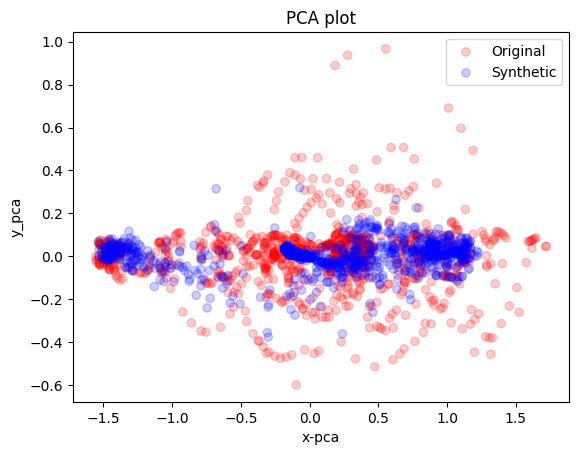

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2000 samples in 0.001s...
[t-SNE] Computed neighbors for 2000 samples in 0.139s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 0.038448
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.072037
[t-SNE] KL divergence after 300 iterations: 0.909210


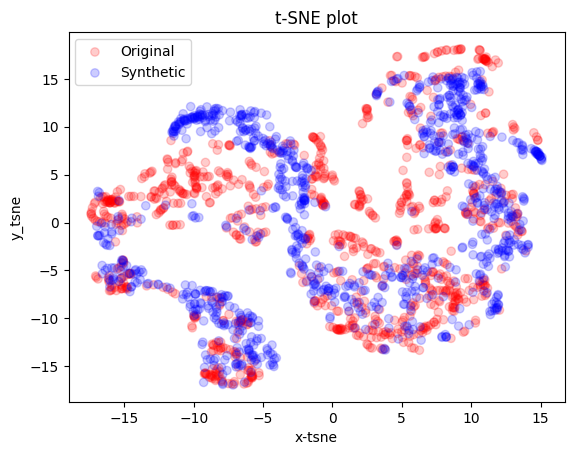

In [106]:
visualization(style_data, generated_data, 'pca')
visualization(style_data, generated_data, 'tsne')